# StyleGAN latent space exploration

## План занятие:
1. Подробнее разобрать StyleGaN
2. Генерация рандомных лиц с помощью StyleGAN 2
3. Исследование разных методовов инверсии  
4. Визуализация точек из латентного пространства и анализ результатов
5. Манипуляции с векторами   


https://github.com/NVlabs/stylegan2-ada-pytorch?tab=readme-ov-file [stylegan2-ada github]

https://github.com/christianversloot/machine-learning-articles/blob/main/stylegan-a-step-by-step-introduction.md [stylegan intro]

https://arxiv.org/pdf/1812.04948.pdf [stylegan]

https://arxiv.org/pdf/1912.04958.pdf [stylegan2]

https://arxiv.org/pdf/2006.06676.pdf [stylegan2-ada]

https://nn.labml.ai/gan/stylegan/index.html [stylegan code explaned]

https://oscar-guarnizo.medium.com/review-image2stylegan-embedding-an-image-into-stylegan-c7989e345271 [latent space]

https://github.com/omertov/encoder4editing?tab=readme-ov-file [encoder for editing]


## Install dependencies

In [2]:
import os, subprocess

WORK_DIR = "/kaggle/working"
os.chdir(WORK_DIR)

subprocess.run(["pip", "install", "-q", "ninja", "imageio-ffmpeg", "lpips",
                "pytorch_msssim", "pytorch-ignite"], check=True)

if not os.path.exists(f"{WORK_DIR}/stylegan2-ada-pytorch"):
    os.system("git clone https://github.com/NVlabs/stylegan2-ada-pytorch")

os.chdir(f"{WORK_DIR}/stylegan2-ada-pytorch")

if not os.path.exists("stylegan2_models"):
    os.system("git clone https://github.com/denkogit/stylegan2_models")

os.makedirs("pretrained_models", exist_ok=True)

if not os.path.exists("pretrained_models/ffhq.pkl"):
    os.system("wget -q https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/ffhq.pkl -P pretrained_models/")

if not os.path.exists("pretrained_models/shape_predictor_68_face_landmarks.dat"):
    os.system("wget -q https://github.com/davisking/dlib-models/raw/master/shape_predictor_68_face_landmarks.dat.bz2 -P pretrained_models/")
    os.system("bzip2 -d pretrained_models/shape_predictor_68_face_landmarks.dat.bz2")

print("Setup done, cwd:", os.getcwd())


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.8/53.8 kB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.2/12.2 MB 94.1 MB/s eta 0:00:00


ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask-cuda 26.2.0 requires cuda-core==0.3.*, but you have cuda-core 1.0.1 which is incompatible.
dask-cuda 26.2.0 requires numba-cuda<0.23.0,>=0.22.1, but you have numba-cuda 0.30.2 which is incompatible.
distributed-ucxx-cu12 0.48.0 requires numba-cuda[cu12]<0.23.0,>=0.22.1, but you have numba-cuda 0.30.2 which is incompatible.
cuml-cu12 26.2.0 requires numba<0.62.0,>=0.60.0, but you have numba 0.65.1 which is incompatible.
cuml-cu12 26.2.0 requires numba-cuda[cu12]<0.23.0,>=0.22.1, but you have numba-cuda 0.30.2 which is incompatible.
ucxx-cu12 0.48.0 requires numba-cuda[cu12]<0.23.0,>=0.22.1, but you have numba-cuda 0.30.2 which is incompatible.
cudf-cu12 26.2.1 requires numba<0.62.0,>=0.60.0, but you have numba 0.65.1 which is incompatible.
cudf-cu12 26.2.1 requires numba-cuda[cu12]<0.23.0,>=0.22.2, but you hav

Setup done, cwd: /kaggle/working/stylegan2-ada-pytorch


In [3]:
import os

os.system("pip install -q gdown")
os.system("gdown --id 1WoiQmg7k-XKYSVNMvAZm_QUqAo_gK5uE -O /kaggle/working/celebs.zip")
os.system("gdown --id 1QIPdkYyIwqEUS8jBNouWo9eYzr3DwDd5 -O /kaggle/working/ms1mv3_arcface_r50_fp16.pth")
os.system("gdown --id 10zYE9lkYq6SuMVL0MaTv4YSuwdg_Wbhg -O /kaggle/working/editing.zip")

os.system("unzip -q /kaggle/working/celebs.zip  -d /kaggle/working/")
os.system("unzip -q /kaggle/working/editing.zip  -d /kaggle/working/")
os.system("rm -rf /kaggle/working/__MACOSX")

print("Files ready")


Downloading...
From: https://drive.google.com/uc?id=1WoiQmg7k-XKYSVNMvAZm_QUqAo_gK5uE
To: /kaggle/working/celebs.zip
100%|██████████| 11.3M/11.3M [00:00<00:00, 70.1MB/s]
Downloading...
From (original): https://drive.google.com/uc?id=1QIPdkYyIwqEUS8jBNouWo9eYzr3DwDd5
From (redirected): https://drive.google.com/uc?id=1QIPdkYyIwqEUS8jBNouWo9eYzr3DwDd5&confirm=t&uuid=07f32c77-2038-43fd-af8a-bf343995fc60
To: /kaggle/working/ms1mv3_arcface_r50_fp16.pth
100%|██████████| 175M/175M [00:02<00:00, 71.4MB/s] 


Files ready


Downloading...
From: https://drive.google.com/uc?id=10zYE9lkYq6SuMVL0MaTv4YSuwdg_Wbhg
To: /kaggle/working/editing.zip
100%|██████████| 9.76k/9.76k [00:00<00:00, 26.3MB/s]


## Align images

In [4]:
import os
import sys

os.chdir("/kaggle/working/stylegan2-ada-pytorch")
sys.path.insert(0, os.getcwd())

from stylegan2_models.image_aligner.face_alignment import image_align
from stylegan2_models.image_aligner.landmarks_detector import LandmarksDetector

landmarks_model_path = "pretrained_models/shape_predictor_68_face_landmarks.dat"
RAW_IMAGES_DIR     = "/kaggle/working/celebs"
ALIGNED_IMAGES_DIR = "/kaggle/working/aligned_images"

landmarks_detector = LandmarksDetector(landmarks_model_path)

for celeb in os.listdir(RAW_IMAGES_DIR):
    celeb_folder = os.path.join(RAW_IMAGES_DIR, celeb)
    if not os.path.isdir(celeb_folder):
        continue
    save_path = os.path.join(ALIGNED_IMAGES_DIR, celeb)
    os.makedirs(save_path, exist_ok=True)
    for i, img_name in enumerate(os.listdir(celeb_folder)):
        if img_name == ".ipynb_checkpoints":
            continue
        raw_img_path = os.path.join(celeb_folder, img_name)
        for face_landmarks in landmarks_detector.get_landmarks(raw_img_path):
            aligned_face_path = os.path.join(save_path, f"{i}.jpg")
            image_align(raw_img_path, aligned_face_path, face_landmarks)

print("Aligned:", os.listdir(ALIGNED_IMAGES_DIR))


Aligned: ['KJunJin', 'Stethem', 'LDCaprio', 'AJoly', 'EMerphy']


# StyleGAN face generation

Setting up PyTorch plugin "bias_act_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!


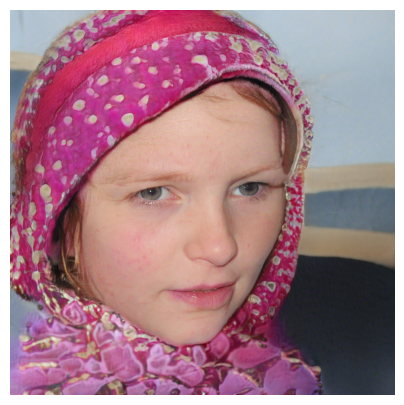

In [5]:
import os
import pickle
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

os.chdir("/kaggle/working/stylegan2-ada-pytorch")

def plot_image(tensor, plot_size=(10, 10)):
    tensor = (tensor.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
    img = Image.fromarray(tensor[0].cpu().numpy(), 'RGB')
    plt.rcParams["figure.figsize"] = plot_size
    plt.imshow(img)
    plt.axis('off')
    plt.show()

def broadcast_w_sg(w_batch, cast_n=18):
    input_ws = []
    for w in w_batch:
        w_broadcast = torch.broadcast_to(w, (cast_n, 512))
        input_ws.append(w_broadcast)
    return torch.stack(input_ws)

seed       = 2345645
noise_mode = 'const'
label      = 0
device     = "cuda:0"
model_path = "/kaggle/working/stylegan2-ada-pytorch/pretrained_models/ffhq.pkl"

with open(model_path, 'rb') as f:
    G = pickle.load(f)['G_ema'].cuda()

z = torch.from_numpy(np.random.RandomState(seed).randn(1, G.z_dim)).to(device)
ws = G.mapping(z, label)
generated_tensor = G.synthesis(ws, noise_mode=noise_mode, force_fp32=True)
plot_image(generated_tensor, (5, 5))


## Truncation

truncation — интерполяция в сторону среднего вектора

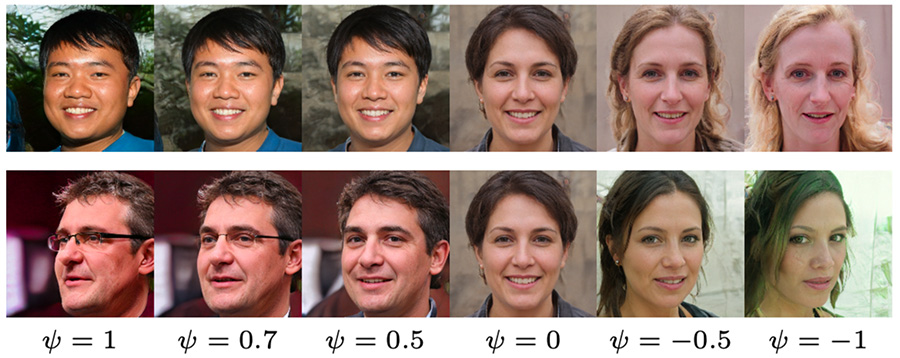

Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!


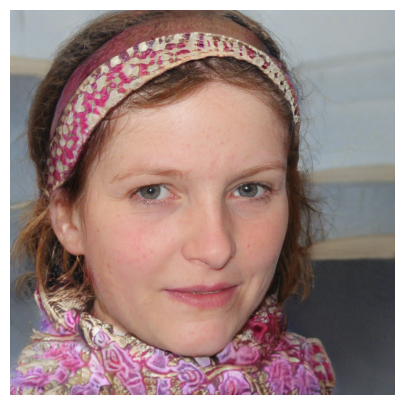

In [6]:
z = torch.from_numpy(np.random.RandomState(seed).randn(1, G.z_dim)).to(device)
ws = G.mapping(z, label, truncation_psi=0.7)
generated_tensor = G.synthesis(ws, noise_mode=noise_mode, force_fp32=True)
plot_image(generated_tensor, (5, 5))


## Projection of real images

Проекция — поиск точки в латентном пространстве, которая визуально будет похожа на реальное изображение.

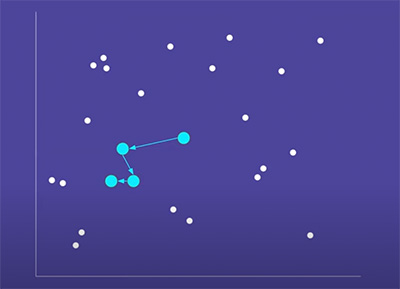

In [7]:
import PIL
import lpips
import torch.nn as nn
import torchvision.transforms as transforms
from pytorch_msssim import ms_ssim
from tqdm import tqdm
import torch.nn.functional as F


class Rec_loss(nn.Module):
    def __init__(self):
        super().__init__()

    def forward(self, target, synth):
        target = (target + 1.0) * 127.5 / 255
        synth  = (synth  + 1.0) * 127.5 / 255
        return torch.mean(1 - ms_ssim(synth, target, data_range=1, size_average=True))


class Lpips_loss(nn.Module):
    def __init__(self, device):
        super().__init__()
        self.lpips_loss = lpips.LPIPS(net='vgg').to(device)

    def forward(self, target, synth):
        return self.lpips_loss(synth, target).mean()


class Reg_loss(nn.Module):
    def __init__(self, w_init):
        super().__init__()
        self.w_init = w_init.detach().clone()

    def forward(self, w):
        return (w - self.w_init).pow(2).mean()


### Encoder for editing

https://arxiv.org/pdf/2102.02766.pdf

Ld-reg — позволяет дельтам не расходиться

Ladv — Дискриминатор сравнивает латенты

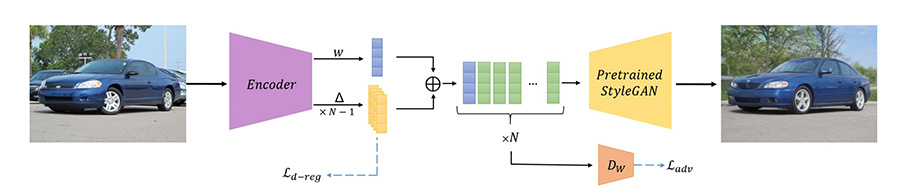

In [9]:
import os
from stylegan2_models.e4e.model_utils import load_e4e_standalone
import torchvision.transforms as transforms

e4e_path = "/kaggle/working/stylegan2-ada-pytorch/pretrained_models/e4e_ffhq_encode.pt"

if not os.path.exists(e4e_path):
    os.system(f'wget -q  "https://huggingface.co/AIRI-Institute/HairFastGAN/resolve/main/pretrained_models/encoder4editing/e4e_ffhq_encode.pt" -O "{e4e_path}"')

e4e_model, _ = load_e4e_standalone(e4e_path)

image2e4etensor = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize((256, 256)),
    transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5]),
])


latent shape: torch.Size([1, 18, 512])
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!
Setting up PyTorch plugin "upfirdn2d_plugin"... Failed!


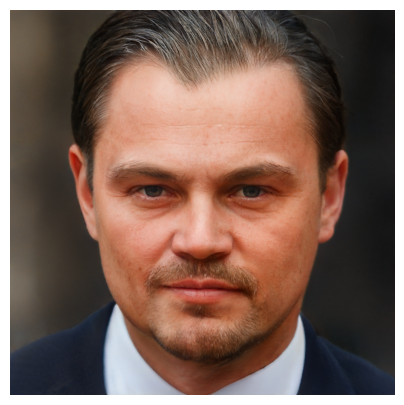

In [10]:
image_path   = "/kaggle/working/aligned_images/LDCaprio/0.jpg"
target_pil   = Image.open(image_path).convert('RGB')
target_uint8 = np.array(target_pil, dtype=np.uint8)

e4e_tensor = image2e4etensor(target_uint8).to(device).unsqueeze(0)
initial_latent_vector = e4e_model(e4e_tensor)
print("latent shape:", initial_latent_vector.size())

generated_tensor = G.synthesis(initial_latent_vector, noise_mode='const', force_fp32=True)
plot_image(generated_tensor, (5, 5))


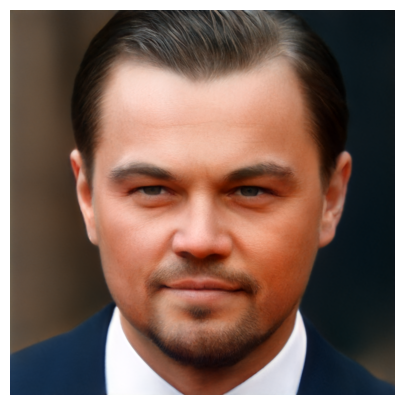

In [39]:
target_tensor = transforms.ToTensor()(target_pil).to(device).unsqueeze(0) * 2 - 1

lpips_loss  = Lpips_loss(device)
rec_loss    = Rec_loss()

num_steps   = 100
lr          = 0.01
lpips_w     = 1.0
rec_w       = 1.0
reg_w       = 0.01

w = nn.Parameter(initial_latent_vector.clone(), requires_grad=True)
reg_loss = Reg_loss(w)
optimizer = torch.optim.Adam([w], lr=lr)

generated_tensors = []
for step in tqdm(range(num_steps)):
    synth_tensor = G.synthesis(w, noise_mode='const')
    loss = (lpips_loss(synth_tensor, target_tensor) * lpips_w
          + rec_loss(synth_tensor, target_tensor) * rec_w
          + reg_loss(w) * reg_w)
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    generated_tensors.append(synth_tensor.detach())

initial_latent_vector = w.detach()
generated_tensor = G.synthesis(initial_latent_vector, noise_mode='const', force_fp32=True)
plot_image(generated_tensor, (5, 5))
print("loss:", loss.item())


## Plot latent using PCA

Метод главных компонент

https://habr.com/ru/post/304214/

In [12]:
import glob
import pandas as pd
from sklearn.decomposition import PCA
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

images_path = "/kaggle/working/aligned_images"
save_path   = "/kaggle/working/e4e_invertion"

data = []
for person in sorted(os.listdir(images_path)):
    person_dir  = os.path.join(images_path, person)
    if not os.path.isdir(person_dir):
        continue
    save_folder = os.path.join(save_path, person)
    os.makedirs(save_folder, exist_ok=True)

    for image_name in sorted(os.listdir(person_dir)):
        if not image_name.lower().endswith(('.jpg', '.jpeg', '.png')):
            continue
        image_path = os.path.join(person_dir, image_name)
        pil = Image.open(image_path).convert('RGB')
        t   = image2e4etensor(np.array(pil, dtype=np.uint8)).to(device).unsqueeze(0)

        with torch.no_grad():
            latent = e4e_model(t).detach().cpu()

        latent_path = os.path.join(save_folder, f"{os.path.splitext(image_name)[0]}.pt")
        torch.save(latent, latent_path)
        data.append({"key": person, "image_path": image_path, "latent_path": latent_path})

df = pd.DataFrame(data)
print(df.head())


     key                                  image_path  \
0  AJoly  /kaggle/working/aligned_images/AJoly/0.jpg   
1  AJoly  /kaggle/working/aligned_images/AJoly/1.jpg   
2  AJoly  /kaggle/working/aligned_images/AJoly/2.jpg   
3  AJoly  /kaggle/working/aligned_images/AJoly/3.jpg   
4  AJoly  /kaggle/working/aligned_images/AJoly/4.jpg   

                                latent_path  
0  /kaggle/working/e4e_invertion/AJoly/0.pt  
1  /kaggle/working/e4e_invertion/AJoly/1.pt  
2  /kaggle/working/e4e_invertion/AJoly/2.pt  
3  /kaggle/working/e4e_invertion/AJoly/3.pt  
4  /kaggle/working/e4e_invertion/AJoly/4.pt  


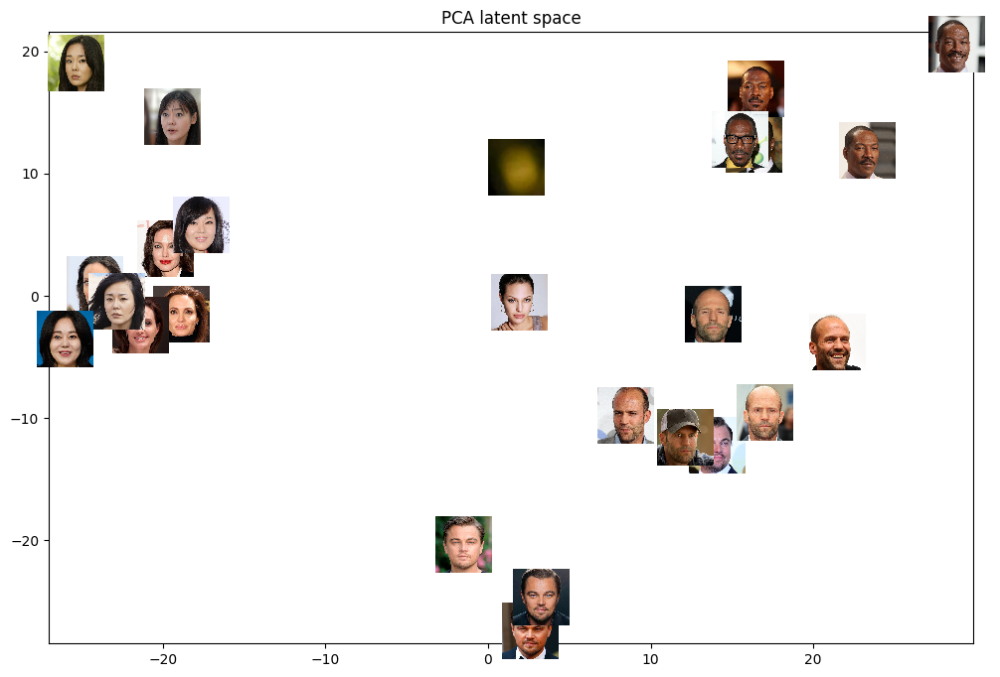

In [13]:
def getImage(path, zoom=0.04):
    return OffsetImage(plt.imread(path), zoom=zoom)

embeddings = []
for _, row in df.iterrows():
    latent = torch.load(row["latent_path"]).numpy().squeeze(0)
    embeddings.append(latent)

batch = np.stack(embeddings, axis=0)
n_samples = batch.shape[0]
batch_flat = batch.reshape(n_samples, -1)

pca = PCA(n_components=2, random_state=22).fit(batch_flat)
coords = pca.transform(batch_flat)

fig, ax = plt.subplots(figsize=(12, 8))
for (x, y), (_, row) in zip(coords, df.iterrows()):
    ab = AnnotationBbox(getImage(row["image_path"]), (x, y), frameon=False)
    ax.add_artist(ab)
    plt.scatter(x, y, label=row["key"])

ax.set_xlim(coords[:, 0].min() - 1, coords[:, 0].max() + 1)
ax.set_ylim(coords[:, 1].min() - 1, coords[:, 1].max() + 1)
plt.title("PCA latent space")
plt.show()


## Interpolation and editing

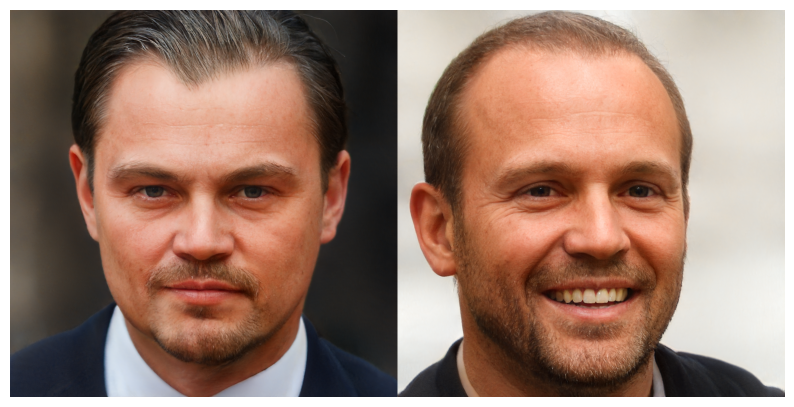

In [24]:
from IPython.display import display
import ipywidgets as widgets

def interpolate(latent1, latent2, psi=0.5, indeces=list(range(0, 18))):
    init_latent = latent1.clone()
    l1 = latent1.clone()
    l2 = latent2.clone()
    for i in indeces:
        l1[:, i] = l2[:, i].lerp(l1[:, i], psi)
    edited = G.synthesis(l1, noise_mode='const', force_fp32=True)
    orig   = G.synthesis(init_latent, noise_mode='const', force_fp32=True)
    plot_image(torch.cat((orig, edited), dim=3), (10, 10))

LATENT_DIR = "/kaggle/working/e4e_invertion"
EDITING_DIR = "/kaggle/working/editing"

latent1 = torch.load(f"{LATENT_DIR}/LDCaprio/0.pt").to(device)
latent2 = torch.load(f"{LATENT_DIR}/Stethem/4.pt").to(device)
interpolate(latent1, latent2, psi=0.3)


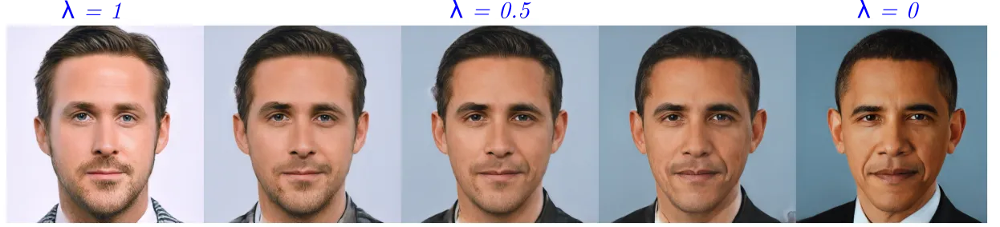

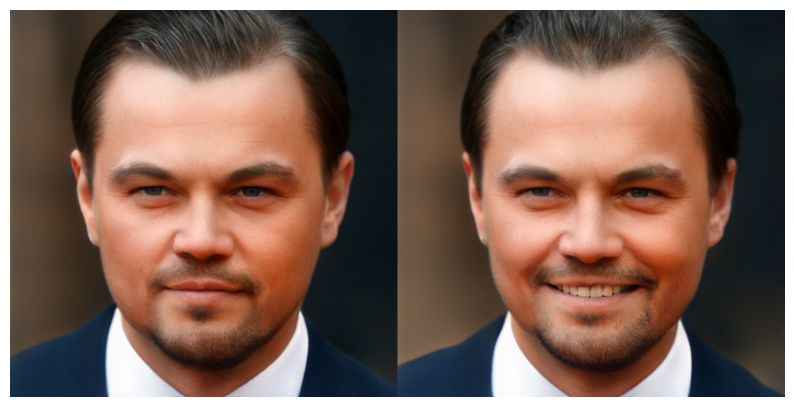

In [25]:
latent1 = initial_latent_vector.clone()
latent2 = torch.load(f"{EDITING_DIR}/smile.pt").to(device)
latent2 = broadcast_w_sg(latent2)

interpolate(latent1, latent2, psi=0.3, indeces=[4])


# Homework

1. **Style Transfer** — смешивание W+ векторов по слоям (crossover)
2. **Expression Transfer** — применение предобученных direction-векторов
3. **Face Swap** — оптимизация с ArcFace identity loss + LPIPS attribute loss


In [36]:
import os, sys
import numpy as np
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision.transforms as transforms
import lpips
import matplotlib.pyplot as plt
from PIL import Image
from tqdm import tqdm
from stylegan2_models.arcface_model import get_model
from stylegan2_models.e4e.model_utils import load_e4e_standalone

WORK_DIR    = "/kaggle/working"
LATENT_DIR  = f"{WORK_DIR}/e4e_invertion"
EDITING_DIR = f"{WORK_DIR}/editing"
ALIGNED_DIR = f"{WORK_DIR}/aligned_images"
ARCFACE_PATH = f"{WORK_DIR}/ms1mv3_arcface_r50_fp16.pth"
STYLE_DIR   = "/kaggle/input/datasets/lastrige/styles"


def image2tensor_norm(pil_image):
    t = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5]),
    ])
    return t(pil_image)

def tensor_to_numpy(t):
    t = (t.permute(0, 2, 3, 1) * 127.5 + 128).clamp(0, 255).to(torch.uint8)
    return t[0].cpu().numpy()

def synthesize(latent):
    with torch.no_grad():
        return G.synthesis(latent, noise_mode='const', force_fp32=True)


class Arcface_Loss(nn.Module):
    def __init__(self, model_path, device):
        super().__init__()
        self.model = get_model('r50', fp16=True)
        self.model.load_state_dict(torch.load(model_path, map_location=device))
        self.model.eval().to(device)
        self.resize = transforms.Resize((112, 112))

    def get_embedding(self, tensor):
        return F.normalize(self.model(self.resize(tensor)))

    def forward(self, synth, target):
        return 1 - (self.get_embedding(synth) * self.get_embedding(target)).sum(dim=1).mean()


image2e4etensor = transforms.Compose([
    transforms.ToTensor(),
    transforms.Resize((256, 256)),
    transforms.Normalize([0.5, 0.5, 0.5], [0.5, 0.5, 0.5]),
])

e4e_path = f"{WORK_DIR}/stylegan2-ada-pytorch/pretrained_models/e4e_ffhq_encode.pt"
e4e_model, _ = load_e4e_standalone(e4e_path)

def encode_image(path):
    pil = Image.open(path).convert('RGB')
    t   = image2e4etensor(np.array(pil)).to(device).unsqueeze(0)
    with torch.no_grad():
        return e4e_model(t)


PERSONS = sorted([
    p for p in os.listdir(LATENT_DIR)
    if os.path.isdir(os.path.join(LATENT_DIR, p))
])
print("Персонажи:", PERSONS)

latents = {}
for person in PERSONS:
    person_dir = os.path.join(LATENT_DIR, person)
    pts = sorted([f for f in os.listdir(person_dir) if f.endswith('.pt')])
    latents[person] = [torch.load(os.path.join(person_dir, p)).to(device) for p in pts]

print("Латенты загружены")


## Style Transfer

W+ пространство: **18 × 512**. Crossover: берём слои 0–7 от reference (личность), заменяем 8–17 на style (цвет, текстура).

| Индексы | Уровень | Что контролируют |
|---------|---------|-----------------|
| 0–3 | Coarse | поза, форма головы |
| 4–7 | Medium | черты лица, форма волос |
| 8–17 | Fine | цвет, текстура, освещение |


In [27]:
def style_transfer(w_content, w_style, style_indices=list(range(8, 18))):
    w_result = w_content.clone()
    for i in style_indices:
        w_result[:, i] = w_style[:, i]
    return w_result


style_files = sorted([
    f for f in os.listdir(STYLE_DIR)
    if f.lower().endswith(('.jpg', '.jpeg', '.png'))
])[:3]

print("Стилевые файлы:", style_files)

style_latents = []
style_names   = []
for fname in style_files:
    path = os.path.join(STYLE_DIR, fname)
    style_latents.append(encode_image(path))
    style_names.append(os.path.splitext(fname)[0])

print("Стили закодированы:", style_names)


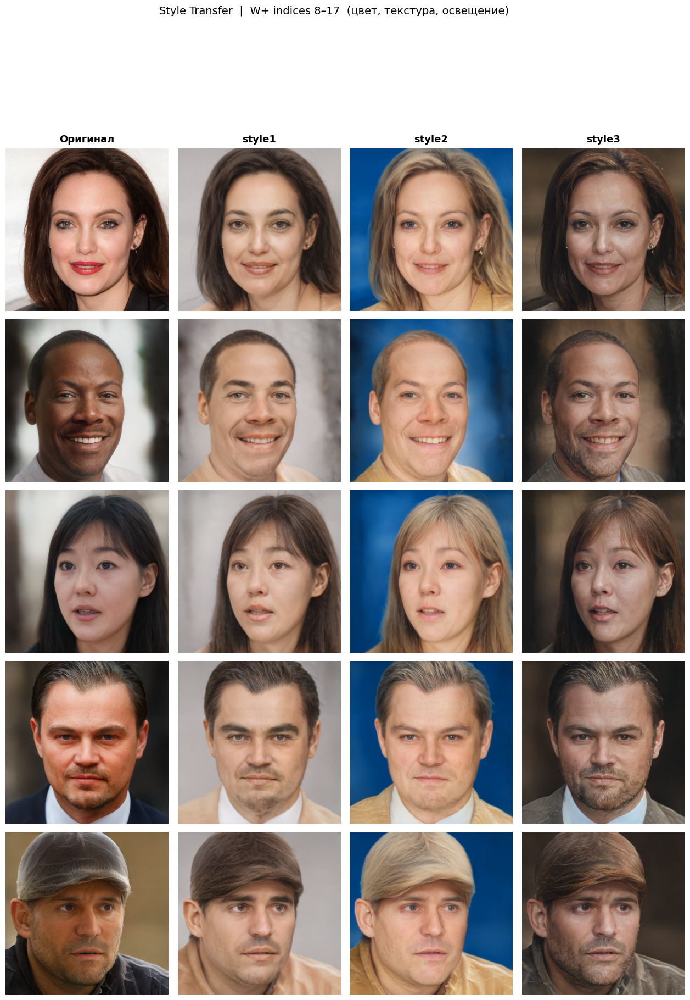

In [28]:
STYLE_INDICES = list(range(8, 18))
n_persons = len(PERSONS)
n_cols    = len(style_latents) + 1

fig, axes = plt.subplots(
    n_persons, n_cols,
    figsize=(4 * n_cols, 4 * n_persons),
    gridspec_kw={"hspace": 0.05, "wspace": 0.05},
)

col_headers = ["Оригинал"] + style_names
for col_i, header in enumerate(col_headers):
    axes[0, col_i].set_title(header, fontsize=13, fontweight='bold', pad=8)

for row_i, person in enumerate(PERSONS):
    w_content = latents[person][0]
    axes[row_i, 0].imshow(tensor_to_numpy(synthesize(w_content)))
    axes[row_i, 0].set_ylabel(person, fontsize=11, rotation=90, labelpad=8)

    for col_i, w_style in enumerate(style_latents, start=1):
        w_mixed = style_transfer(w_content, w_style, STYLE_INDICES)
        axes[row_i, col_i].imshow(tensor_to_numpy(synthesize(w_mixed)))

for ax in axes.flat:
    ax.axis('off')

plt.suptitle(
    f"Style Transfer  |  W+ indices {STYLE_INDICES[0]}–{STYLE_INDICES[-1]}  (цвет, текстура, освещение)",
    fontsize=14, y=1.01,
)
plt.tight_layout()
plt.savefig(f"{WORK_DIR}/style_transfer_table.png", dpi=120, bbox_inches='tight')
plt.show()


## Expression Transfer

`w_edited[:, i] = lerp(w_base[:, i], w_editing[:, i], ψ)` по выбранным слоям W+.

| Атрибут | Слои W+ | ψ |
|---------|---------|---|
| Smile | 0–6 | 0.5 |
| Age   | 0–6 | 0.5 |
| Pose  | 0–6 | 0.4 |


In [29]:
def broadcast_w(w, cast_n=18):
    if w.dim() == 2:
        w = w.unsqueeze(1).repeat(1, cast_n, 1)
    return w

def apply_expression(w_base, w_editing, indices, psi=0.5):
    w_result = w_base.clone()
    for i in indices:
        w_result[:, i] = w_base[:, i].lerp(w_editing[:, i], psi)
    return w_result


EXPRESSIONS = {
    'Smile': {'path': f'{EDITING_DIR}/smile.pt', 'indices': list(range(0, 7)), 'psi': 0.5},
    'Age':   {'path': f'{EDITING_DIR}/age.pt',   'indices': list(range(0, 7)), 'psi': 0.5},
    'Pose':  {'path': f'{EDITING_DIR}/pose.pt',  'indices': list(range(0, 7)), 'psi': 0.4},
}

editing_vectors = {}
for name, cfg in EXPRESSIONS.items():
    w = torch.load(cfg['path']).to(device)
    editing_vectors[name] = broadcast_w(w)
    print(f"{name}: {editing_vectors[name].shape}")


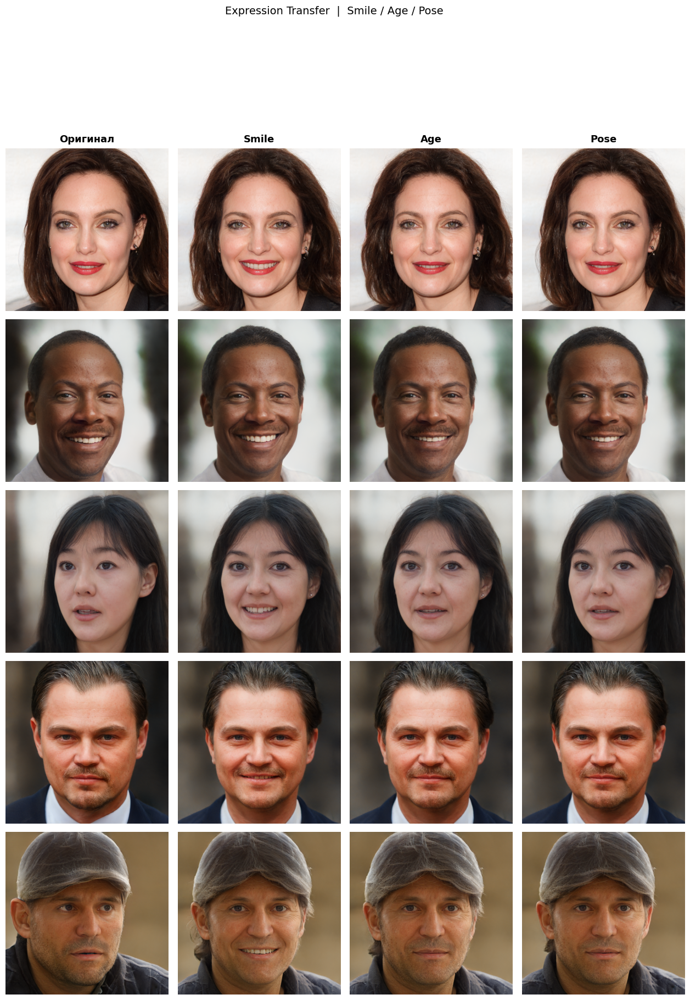

In [30]:
expr_names = list(EXPRESSIONS.keys())
n_cols     = len(expr_names) + 1

fig, axes = plt.subplots(
    n_persons, n_cols,
    figsize=(4 * n_cols, 4 * n_persons),
    gridspec_kw={"hspace": 0.05, "wspace": 0.05},
)

col_headers = ["Оригинал"] + expr_names
for col_i, header in enumerate(col_headers):
    axes[0, col_i].set_title(header, fontsize=13, fontweight='bold', pad=8)

for row_i, person in enumerate(PERSONS):
    w_base = latents[person][0]
    axes[row_i, 0].imshow(tensor_to_numpy(synthesize(w_base)))
    axes[row_i, 0].set_ylabel(person, fontsize=11, rotation=90, labelpad=8)

    for col_i, name in enumerate(expr_names, start=1):
        cfg    = EXPRESSIONS[name]
        w_edit = editing_vectors[name]
        w_res  = apply_expression(w_base, w_edit, cfg['indices'], cfg['psi'])
        axes[row_i, col_i].imshow(tensor_to_numpy(synthesize(w_res)))

for ax in axes.flat:
    ax.axis('off')

plt.suptitle("Expression Transfer  |  Smile / Age / Pose", fontsize=14, y=1.01)
plt.tight_layout()
plt.savefig(f"{WORK_DIR}/expression_transfer_table.png", dpi=120, bbox_inches='tight')
plt.show()


## Face Swap с ArcFace Loss

$$\mathcal{L} = \lambda_{arc}\cdot(1 - \cos(e_{synth}, e_{id})) + \lambda_{lpips}\cdot LPIPS(synth,\,attr)$$

Строки = identity donor (чьё лицо), столбцы = attribute donor (чья поза).


In [37]:
lpips_fn = lpips.LPIPS(net='vgg').to(device)
arcface  = Arcface_Loss(ARCFACE_PATH, device)

ARCFACE_WEIGHT = 0.5
LPIPS_WEIGHT   = 1.0
REG_WEIGHT     = 0.01
NUM_STEPS      = 80
LR             = 0.01

resize256 = transforms.Resize((256, 256))

PERSONS_3 = PERSONS[:3]

person_data = {}
for person in PERSONS_3:
    img_dir  = os.path.join(ALIGNED_DIR, person)
    img_file = sorted([
        f for f in os.listdir(img_dir)
        if f.lower().endswith(('.jpg', '.jpeg', '.png'))
    ])[0]
    pil    = Image.open(os.path.join(img_dir, img_file)).convert('RGB')
    tensor = image2tensor_norm(pil).to(device).unsqueeze(0)
    person_data[person] = {
        "pil":    pil,
        "tensor": tensor,
        "latent": latents[person][0],
    }

print("Персонажи для face swap:", PERSONS_3)


def face_swap(w_attr_init, id_tensor, attr_tensor):
    w         = nn.Parameter(w_attr_init.clone())
    optimizer = torch.optim.Adam([w], lr=LR)
    # ArcFace требует 112x112, LPIPS — 256x256
    id_arc    = arcface.resize(id_tensor).detach()
    attr_r    = resize256(attr_tensor).detach()

    with torch.no_grad():
        id_embed = F.normalize(arcface.model(id_arc))

    for _ in tqdm(range(NUM_STEPS), desc="swap", leave=False):
        optimizer.zero_grad()
        synth     = G.synthesis(w, noise_mode='const', force_fp32=True)
        synth_arc = arcface.resize(synth)
        synth_lp  = resize256(synth)

        s_embed  = F.normalize(arcface.model(synth_arc))
        arc_loss = 1 - (s_embed * id_embed).sum(dim=1).mean()
        lp_loss  = lpips_fn(synth_lp, attr_r).mean()
        reg_loss = (w - w_attr_init).pow(2).mean()

        loss = ARCFACE_WEIGHT * arc_loss + LPIPS_WEIGHT * lp_loss + REG_WEIGHT * reg_loss
        loss.backward()
        optimizer.step()

    with torch.no_grad():
        return tensor_to_numpy(G.synthesis(w.detach(), noise_mode='const', force_fp32=True))


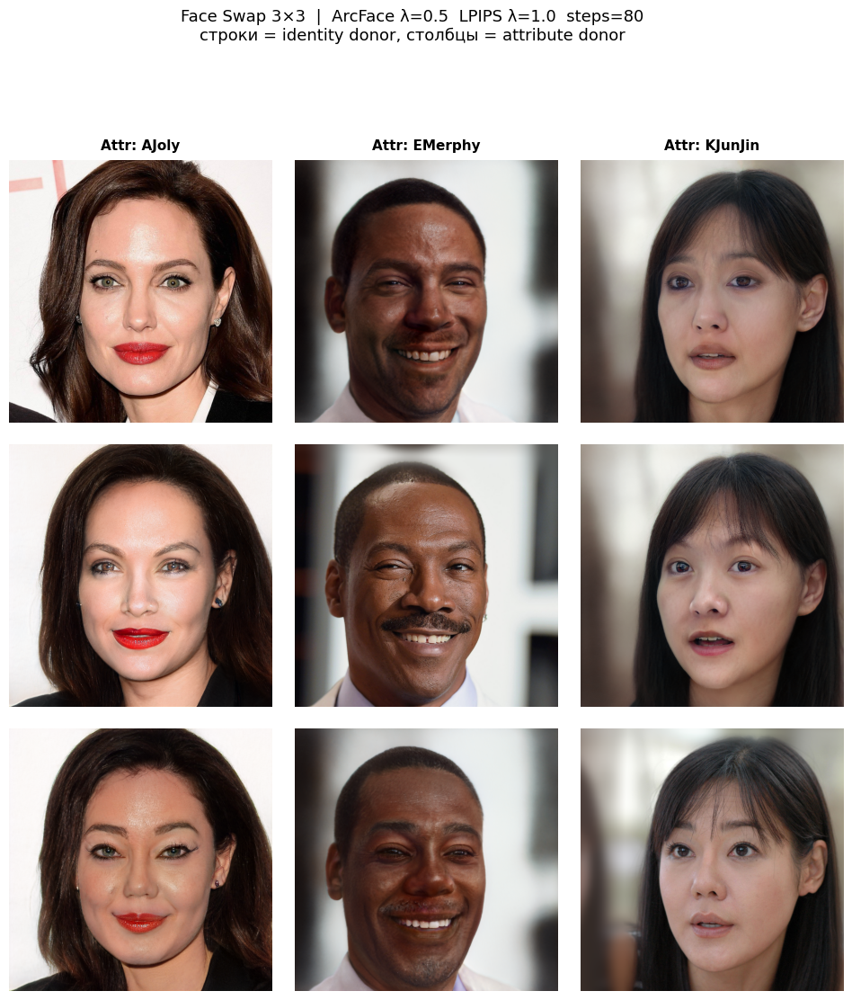

In [38]:
n = len(PERSONS_3)
fig, axes = plt.subplots(
    n, n,
    figsize=(4 * n, 4 * n),
    gridspec_kw={"hspace": 0.08, "wspace": 0.08},
)

for col_i, p in enumerate(PERSONS_3):
    axes[0, col_i].set_title(f"Attr: {p}", fontsize=11, fontweight='bold', pad=8)
for row_i, p in enumerate(PERSONS_3):
    axes[row_i, 0].set_ylabel(f"ID: {p}", fontsize=11, labelpad=8)

for row_i, id_person in enumerate(PERSONS_3):
    for col_i, attr_person in enumerate(PERSONS_3):
        if id_person == attr_person:
            img = np.array(person_data[id_person]["pil"])
        else:
            img = face_swap(
                w_attr_init = person_data[attr_person]["latent"],
                id_tensor   = person_data[id_person]["tensor"],
                attr_tensor = person_data[attr_person]["tensor"],
            )
        axes[row_i, col_i].imshow(img)
        axes[row_i, col_i].axis('off')

plt.suptitle(
    f"Face Swap 3×3  |  ArcFace λ={ARCFACE_WEIGHT}  LPIPS λ={LPIPS_WEIGHT}  steps={NUM_STEPS}\n"
    "строки = identity donor, столбцы = attribute donor",
    fontsize=13, y=1.02,
)
plt.tight_layout()
plt.savefig(f"{WORK_DIR}/face_swap_3x3.png", dpi=120, bbox_inches='tight')
plt.show()
print("Сохранено: face_swap_3x3.png")
